In [1]:
import pandas as pd

df = pd.read_csv("Dataset .csv")   # example: zomato.csv
df.head()


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [2]:
# Check first few rows
df[['Restaurant Name', 'City', 'Longitude', 'Latitude']].head()

# Check for missing values
df[['Longitude', 'Latitude']].isnull().sum()


Longitude    0
Latitude     0
dtype: int64

In [3]:
df = df.dropna(subset=['Longitude', 'Latitude'])


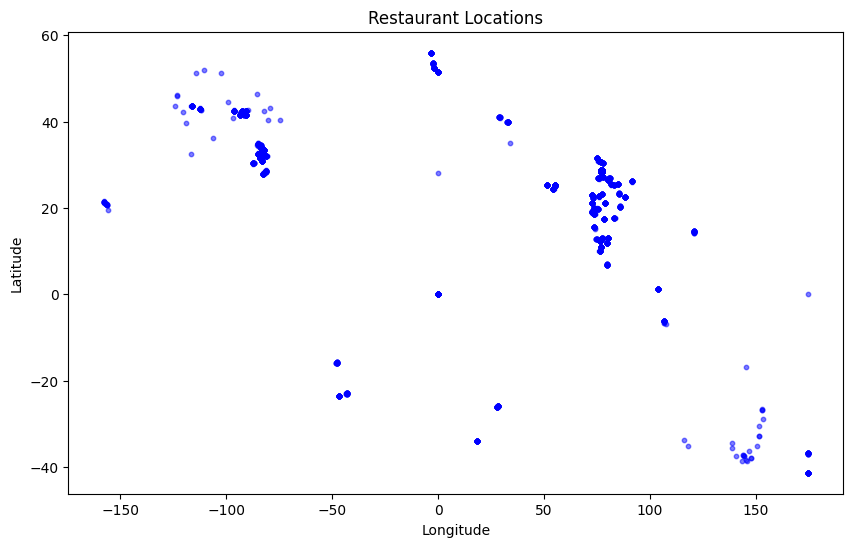

In [4]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.scatter(df['Longitude'], df['Latitude'], alpha=0.5, c='blue', s=10)
plt.title('Restaurant Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [6]:
!pip install folium



   ------------- -------------------------- 1/3 [branca]
   -------------------------- ------------- 2/3 [folium]
   -------------------------- ------------- 2/3 [folium]
   -------------------------- ------------- 2/3 [folium]
   -------------------------- ------------- 2/3 [folium]
   -------------------------- ------------- 2/3 [folium]
   -------------------------- ------------- 2/3 [folium]
   -------------------------- ------------- 2/3 [folium]
   ---------------------------------------- 3/3 [folium]




[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
import folium
print(folium.__version__)  # should print the installed version


0.20.0


In [8]:
import folium

# Create a base map centered around the mean coordinates
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Add restaurant locations
for idx, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        popup=f"{row['Restaurant Name']} ({row['City']})",
        color='red',
        fill=True,
        fill_opacity=0.6
    ).add_to(restaurant_map)

# Display map
restaurant_map.save('restaurant_map.html')


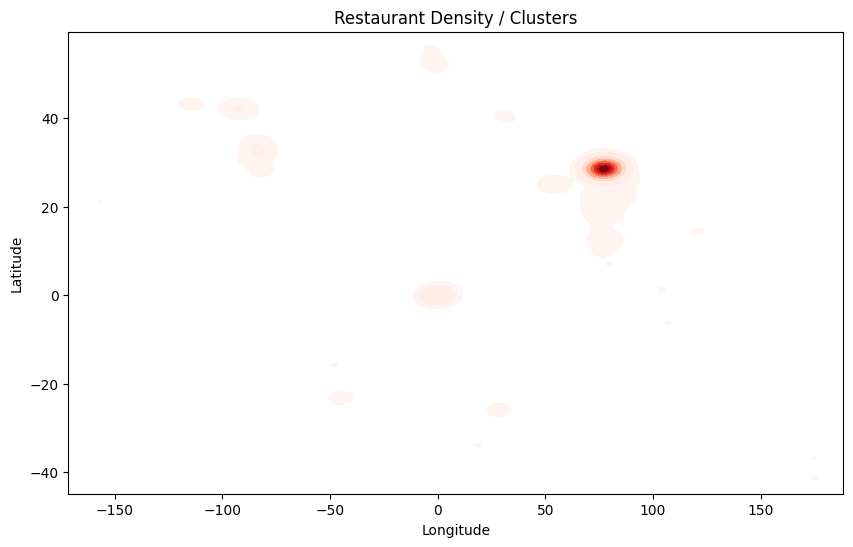

In [9]:
import seaborn as sns

plt.figure(figsize=(10,6))
sns.kdeplot(x=df['Longitude'], y=df['Latitude'], cmap='Reds', fill=True, bw_adjust=0.5)
plt.title('Restaurant Density / Clusters')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


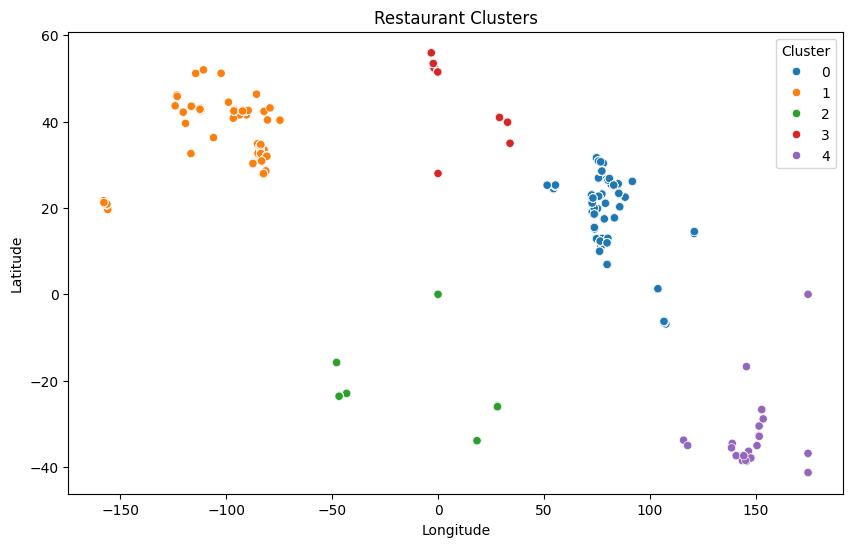

In [10]:
from sklearn.cluster import KMeans
import numpy as np

coords = df[['Latitude', 'Longitude']].values
kmeans = KMeans(n_clusters=5, random_state=0).fit(coords)
df['Cluster'] = kmeans.labels_

# Plot clusters
plt.figure(figsize=(10,6))
sns.scatterplot(x='Longitude', y='Latitude', hue='Cluster', data=df, palette='tab10')
plt.title('Restaurant Clusters')
plt.show()


In [11]:
import folium


In [12]:
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)


In [13]:
for idx, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],  # position
        radius=3,                                      # size of marker
        popup=f"{row['Restaurant Name']} ({row['City']})",  # shows on click
        color='red',
        fill=True,
        fill_opacity=0.6
    ).add_to(restaurant_map)


In [14]:
restaurant_map


In [15]:
restaurant_map.save('restaurant_map.html')
